# Bayesian multilevel A/B testing
## Introduction

In this example, I used synthetic data to tune a model to estimate the magnitude of response to a yes/no manipulation. The response is binary (True/False).
Other potential examples of a binary response:
 - Click 
 - Disease outbreak
 - Financial transaction
Why use synthetic data and not prediction on real data? To explore potential features of data that could make the model give misleading results, even those features underrepresented in the curent dataset. 

## Problem summary
- Binary response variable (spike/no spike at any given time)
- One source of variability to estimate
    1. Stimulation
- Several sources of spurious variability to explain away
    1. Time
    2. Subject
    3. Trial
    4. Neuron

## Goals

1. To estimate the effects of stimulation
2. To understand the limits of what variability we can explain away


## Thought process
I conceptualized that neurons vary in slopes and intercepts, while subjects vary in their slopes only. On the basis of this hypothesis, I generated Poisson data with the following rules:

1. Emissions are poisson-distubuted and have a time component
2. Subjects have varying strengths of effects of experimental condition

There are three subjects with five neurons each. Some invervention is applied (pharmaceutical, stimulation, etc) that affects how often neurons are activated.

3. Neuron 4 of mouse 0 has the least effect
4. Neuron 0 mouse 2 has the most effect
5. Slow neurons are affected the most across all mice



## Exploratory plots inform the model

Make up some data

In [1]:
import altair as alt
from IPython.core.display import Image, display
from bayes_window import generate_fake_spikes, fake_spikes_explore, BayesRegression


df, df_monster, index_cols, firing_rates = generate_fake_spikes(n_trials=20,
                                                                n_neurons=6,
                                                                n_mice=3,
                                                                dur=5,
                                                                mouse_response_slope=40,
                                                                overall_stim_response_strength=5)

In [2]:
# Make plots:
charts = fake_spikes_explore(df=df, df_monster=df_monster, index_cols=index_cols)

# Render plots:
charts[-2].properties(title=['Emissions are poisson-distubuted and have a distinct time component', 
                             'Try pinching/scrolling and panning with your touchpad/mouse!']).interactive().display()
charts[-3].properties(title=['Subjects have varying strengths of effects of experimental condition',
                             'Hoverable, try it!']).interactive().display()


alt.FacetChart(...)

alt.FacetChart(...)

Exploratory plots suggested a split by subject and neuron is necessary. A Bayesian hierarchical model estimating both slopes and intercepts proved unsatisfactory. I simplified the generative model to only estimate the intercepts and slopes for subjects, not neurons. It proved an excellent fit and predictor and generalized well to real data.

1. I decided to use the time elapsed between positive events (inter-spike interval, ISI) as the measure of activity

In [3]:
charts[4]

alt.LayerChart(...)

2. Neurons with a slow baseline seemed to respond more:

In [4]:
charts[1]

alt.Chart(...)

Same with all neurons:

In [5]:
charts[3]

alt.Chart(...)

A simpler visualization of stim effect:

In [6]:
charts[5]

alt.FacetChart(...)

## Hierarchical Bayesian generalized linear model shows details of stim effect

Uses my homegrown `bayes-window` package for rapid prototyping

In [7]:
%%capture
bw = BayesRegression(df=df,
                     y='isi',
                     treatment='stim',
                     condition=['neuron'], 
                     group='mouse',
                     detail='i_trial',
                     ).fit(dist_y='gamma',
                           add_group_intercept=True,
                           add_group_slope=True)

The effect on each neuron from each mouse is reconstructed approximately correctly. Faint band below is 95% highest density probability interval (HDPI), bright band 75% HDPI. Line overlays the mean for comparison

In [8]:
bw.plot(x=alt.X('neuron:N')).facet('mouse').properties(title=['Estimates of stim effect',' +- 75% (dark) and 95% (light) CI','Also hoverable'])

alt.FacetChart(...)

The overall firing rate for each mouse is also correctly reconstructed. Compare ISI means (lines connecting `stim=0` and `stim=1`) to model intercepts (ticks):

In [9]:
bw.plot_intercepts().properties(title='Ticks=posteriors for intercepts, lines=raw ISI means ')

alt.VConcatChart(...)

The overall effect for each mouse is correctly reconstructed:

In [10]:

slopes = bw.trace.posterior['slope_per_group'].mean(['chain', 'draw']).to_dataframe().reset_index()
chart_slopes = alt.Chart(slopes).mark_bar(tooltip=True).encode(
    x=alt.X('mouse_:O', title='Mouse'),
    y=alt.Y('slope_per_group', title='Slope')
)
chart_slopes.properties(title='Quick and dirty estimate for group-level sloopes')

alt.Chart(...)

## Alternative models help understand the model's performance
- Lognormal and gamma distributions are much better than normal distribution for this data
- Removing condition (neuron) or group (mouse) hurts the model
- Removing treatment (stimulation) breaks the model

These are null-hypothesis tests in a sense

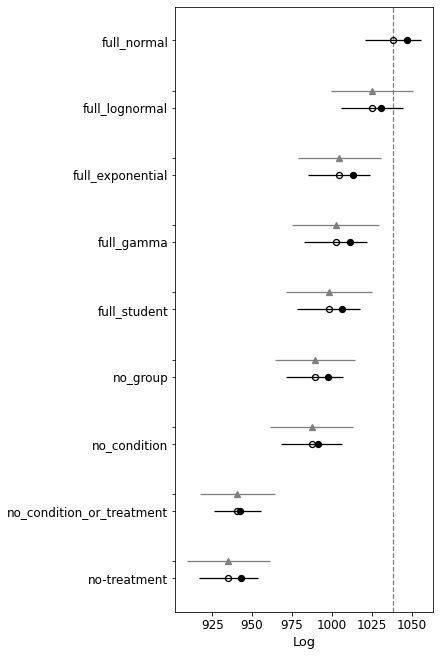

,rank,loo,p_loo,d_loo,weight,se,dse,warning,loo_scale
full_normal,0,1038.476273,8.857464,0.000000,4.641411e-01,17.722327,0.000000,False,log
full_lognormal,1,1025.218315,5.878900,13.257958,3.168035e-01,19.381136,25.874938,False,log
full_exponential,2,1004.525097,8.533168,33.951176,6.491124e-02,19.240242,26.038241,False,log
full_gamma,3,1002.327556,8.971150,36.148717,1.504434e-01,19.506079,27.105465,False,log
full_student,4,998.057757,8.467835,40.418516,3.700753e-03,19.832631,26.853519,False,log
no_group,5,989.331556,8.274291,49.144717,1.177278e-10,17.762827,24.955303,False,log
no_condition,6,987.352058,4.179135,51.124215,1.055800e-10,19.030375,25.916221,False,log
no_condition_or_treatment,7,940.815743,1.924684,97.660530,1.094358e-11,14.872856,23.709249,False,log
no-treatment,8,935.136874,7.824656,103.339399,0.000000e+00,18.307219,25.890334,False,log


In [11]:
bw.explore_models()

## Diagnostics
Let's make sure that the traces are well-mixed and there are not areas of posterior with lots of divergences

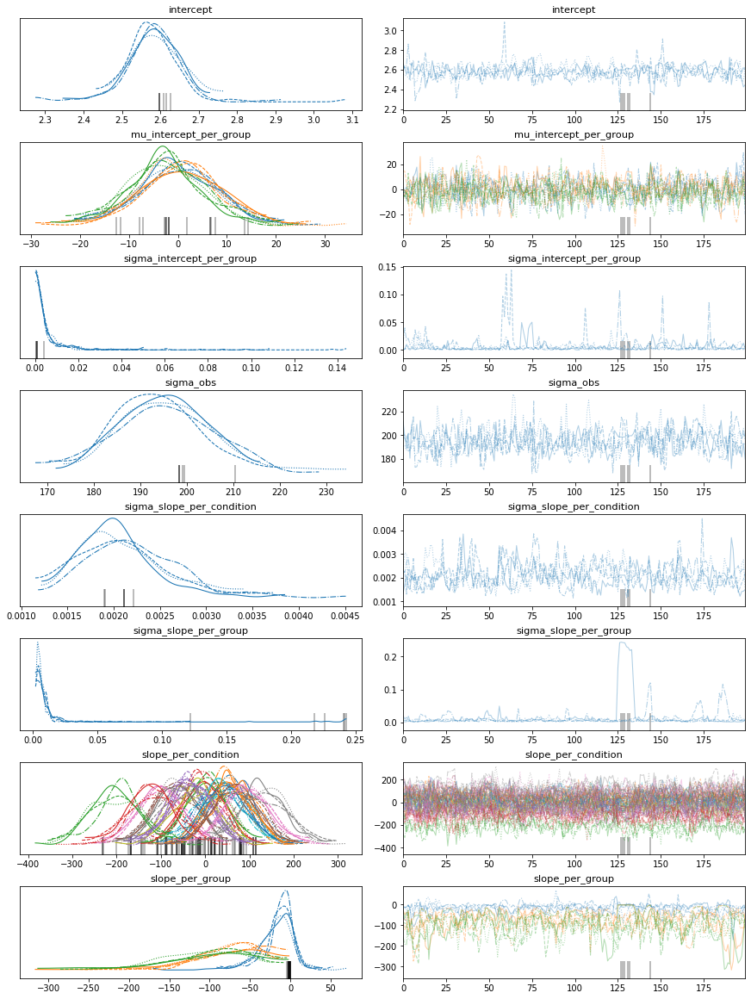

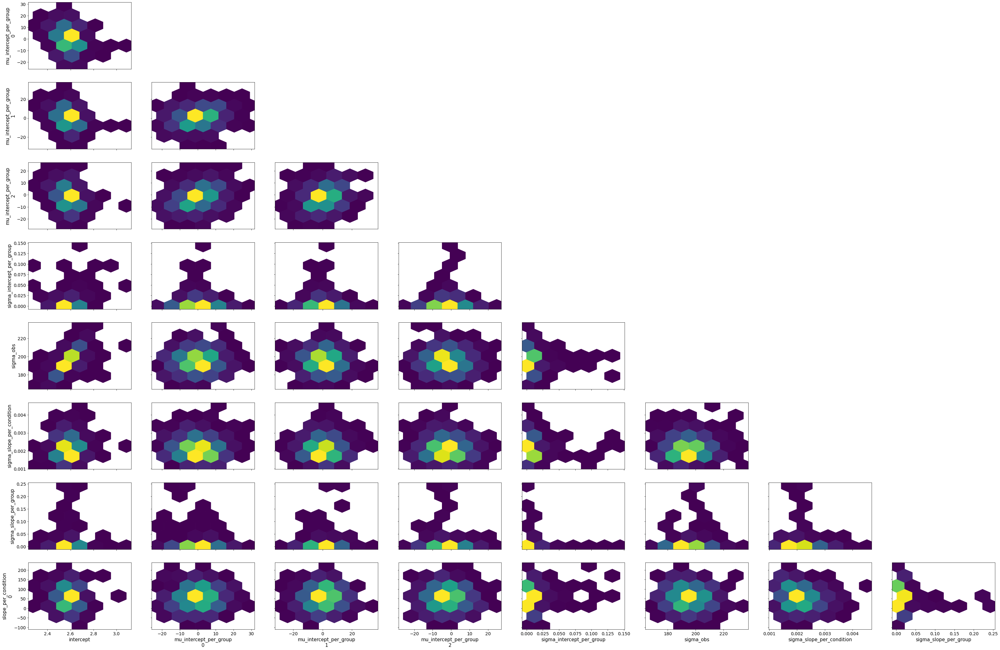

In [12]:
bw.plot_model_quality()

## Out-of-sample classification
In this synthetic dataset (simplified version for speed), gamma-distributed multilevel GLM (`bw_gamma`) works better for out-of-sample classification than normally-distributed multilevel GLM (`bw_normal`) or frequentist mixed linear  model (`mlm`) and ANOVA (`anova`):

In [13]:
%%capture
# Loop over some conditions and collect results:
# NBVAL_SKIP
from bayes_window import model_comparison
import numpy as np

res = model_comparison.run_conditions(
    true_slopes=np.hstack([np.zeros(15), np.tile(10, 15)]), 
    n_trials=np.linspace(10, 70, 5).astype(int),
    ys=('Power',),
    parallel=True)

Binary confusion matrix shows that gamma distribution gives us the most sensitive results. Look for a bright diagonal on top-left to bottom-right:

In [14]:
# NBVAL_SKIP
from importlib import reload
reload(model_comparison)
model_comparison.plot_confusion(
    model_comparison.make_confusion_matrix(res.query('y== "Power"'), ('method', 'y', 'randomness', 'n_trials')
                                           )).properties(width=140).facet(row='method', column='n_trials')

alt.FacetChart(...)

ROC curve reinforces this conclusion:

In [15]:
df = model_comparison.make_roc_auc(res, binary=False, groups=('method', 'y', 'n_trials'))

bars, roc = model_comparison.plot_roc(df)
bars.facet(column='n_trials', row='y').properties().display()
roc.facet(column='n_trials', row='y').properties()
# NBVAL_SKIP

alt.FacetChart(...)

alt.FacetChart(...)